In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

Leitura e análise inicial dos dados

In [ ]:
path = 'C:/Users/Kanel/University/FIC_DL/datasets/'

In [ ]:
df = pd.read_csv(path + "Bank_Personal_Loan_Modelling.csv")
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [ ]:
df.describe()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.104600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,1443.520003,11.463166,11.467954,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,1.000000,23.000000,-3.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


Identificação e tratamento dos dados:

Como a coluna ID é apenas uma identificação, ela não será necessária para o processo, podendo ser retirada:

In [ ]:
df.drop("ID", axis=1, inplace=True)
df

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


Resolvendo valores nulos se houver:

In [ ]:
df.fillna(0, inplace=True)

Conforme visto no 'describe()', a "Experience" possui valores negativos, que podem prejudicar nossa análise, portanto serão identificados e tratados conforme o necessário:

In [ ]:
print('Valores negativos:', df[df['Experience'] < 0]['Experience'].unique(),\
      '| Quantidade de entradas:', len(df[df['Experience'] < 0]))

Valores negativos: [-1 -2 -3] | Quantidade de entradas: 52


In [ ]:
df["Experience"] = df["Experience"].replace(-1, 1)
df["Experience"] = df["Experience"].replace(-2, 2)
df["Experience"] = df["Experience"].replace(-3, 3)

In [ ]:
print('Valores negativos:', df[df['Experience'] < 0]['Experience'].unique(),\
      '| Quantidade de entradas:', len(df[df['Experience'] < 0]))

Valores negativos: [] | Quantidade de entradas: 0


Também foi visto no 'describe()' que há valores com menos de 5 dígitos no "ZIP Code" que trata-se de uma valor inválido:

In [ ]:
df[df['ZIP Code'] < 10000]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
384,51,25,21,9307,4,0.6,3,0,0,0,0,1,1


In [ ]:
df.drop([384], axis=0, inplace=True)

In [ ]:
df[df['ZIP Code'] < 10000]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard


Usando o 'describe()' novamente, veremos que essas situações foram corrigidas:

In [ ]:
df.describe()

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000
mean,45.337267,20.133627,73.784757,93169.275455,2.396079,1.938206,1.880776,56.510102,0.096019,0.104421,0.060412,0.596719,0.293859
std,11.464033,11.416124,46.032281,1759.630610,1.147554,1.747731,0.839804,101.720837,0.294647,0.305836,0.238273,0.490605,0.455574
min,23.000000,0.000000,8.000000,90005.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Com esse tratamento, podemos separar nossos dados nas informações que serão utilizadas como base e aquilo que desejamos prever:

In [ ]:
data = df.drop("Personal Loan", axis=1)
target = df['Personal Loan']

Verificando a correlação entre as características:

In [ ]:
df.corr()

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
Age,1.000000,0.993991,-0.055164,-0.030526,-0.046566,-0.051941,0.041211,-0.012484,-0.007694,-0.000403,0.008068,0.013622,0.007530
Experience,0.993991,1.000000,-0.046785,-0.030833,-0.051981,-0.049676,0.013808,-0.011050,-0.008276,-0.000960,0.009757,0.013982,0.008721
Income,-0.055164,-0.046785,1.000000,-0.030725,-0.157232,0.645931,-0.187277,0.206712,0.502459,-0.002695,0.169703,0.014397,-0.002030
ZIP Code,-0.030526,-0.030833,-0.030725,1.000000,0.027532,-0.012197,-0.008254,0.003608,-0.002977,0.002418,0.021669,0.028328,0.024055
Family,-0.046566,-0.051981,-0.157232,0.027532,1.000000,-0.109088,0.064581,-0.020294,0.061471,0.020094,0.014184,0.010127,0.011160
CCAvg,-0.051941,-0.049676,0.645931,-0.012197,-0.109088,1.000000,-0.135952,0.109829,0.366864,0.015035,0.136504,-0.003486,-0.006454
Education,0.041211,0.013808,-0.187277,-0.008254,0.064581,-0.135952,1.000000,-0.033186,0.136834,-0.010723,0.014004,-0.015227,-0.011432
Mortgage,-0.012484,-0.011050,0.206712,0.003608,-0.020294,0.109829,-0.033186,1.000000,0.142065,-0.005449,0.089286,-0.005904,-0.007061
Personal Loan,-0.007694,-0.008276,0.502459,-0.002977,0.061471,0.366864,0.136834,0.142065,1.000000,0.021932,0.316344,0.006332,0.002903
Securities Account,-0.000403,-0.000960,-0.002695,0.002418,0.020094,0.015035,-0.010723,-0.005449,0.021932,1.000000,0.317023,0.012685,-0.014926


In [ ]:
import seaborn as sns

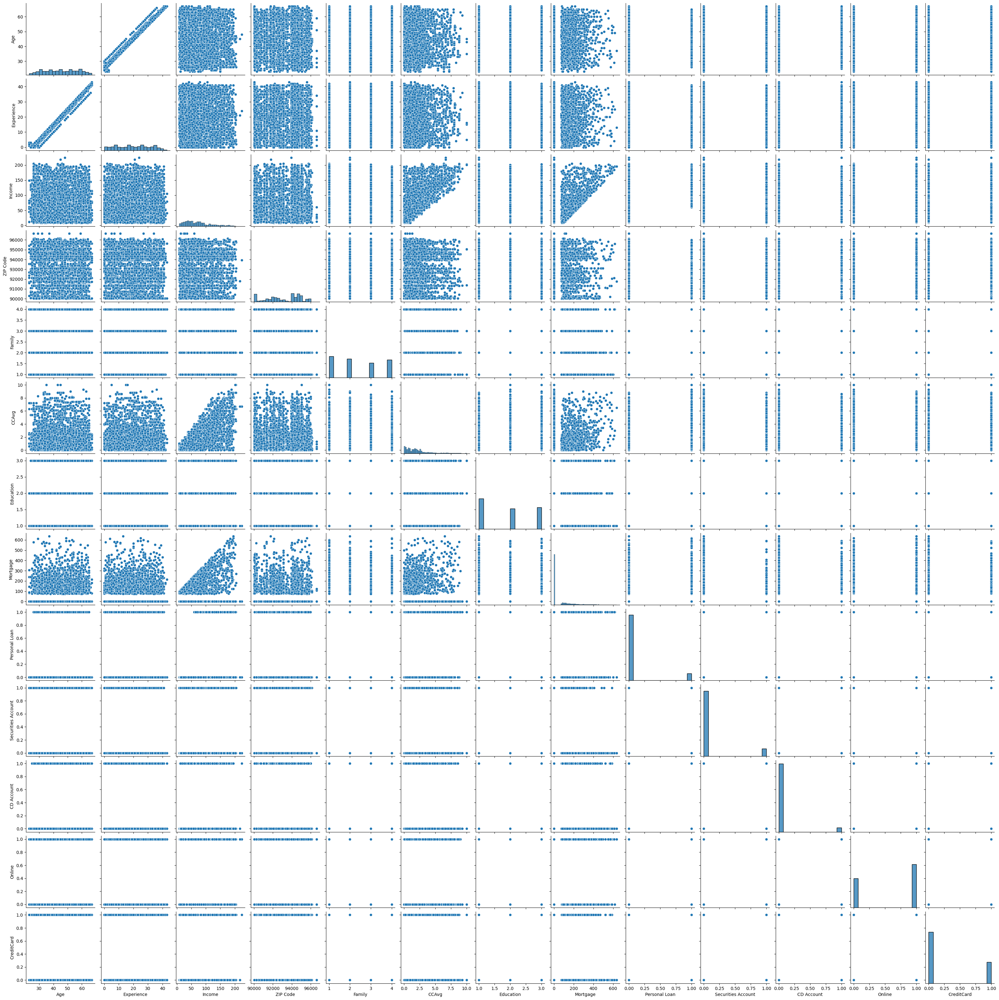

In [ ]:
sns.pairplot(df)

In [ ]:
import plotly.express as px

In [ ]:
features = list(data.columns)
features

['Age',
 'Experience',
 'Income',
 'ZIP Code',
 'Family',
 'CCAvg',
 'Education',
 'Mortgage',
 'Securities Account',
 'CD Account',
 'Online',
 'CreditCard']

In [ ]:
fig = px.scatter_matrix(df, dimensions = features, color="Personal Loan")
fig.update_traces(diagonal_visible = False)
fig.show()

C:\Users\Kanel\.conda\envs\gpu\lib\site-packages\plotly\express\_core.py:279: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  dims = [


Visualizando os 4 componentes principais:

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA()

components = pca.fit_transform(data)

labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

In [ ]:
fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df["Personal Loan"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

C:\Users\Kanel\.conda\envs\gpu\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



Utilizando os 2 componentes mais importantes:

In [ ]:
pca = PCA(n_components=2)
components = pca.fit_transform(data)

total_var = pca.explained_variance_ratio_.sum() * 100
print('Total da variância capturada: ', total_var)

fig = px.scatter(components, x=0, y=1, color=df['Personal Loan'])
fig.show()

Total da variância capturada:  99.92693525086847


Dividindo os dados em treino e teste:

In [ ]:
from sklearn.model_selection import train_test_split as tts

In [ ]:
x_train, x_test, y_train, y_test = tts(components, target, test_size=0.3, random_state=42)

In [ ]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((3499, 2), (3499,), (1500, 2), (1500,))

Padronizando as escalas:

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
sc = StandardScaler()
sc.fit(x_train)

StandardScaler()

In [ ]:
x_train = sc.transform(x_train)
x_test = sc.transform(x_test)

In [ ]:
def stdScalerModel(clf):
    std_clf = clf.fit(components, target)
    return std_clf

Classificador Binário:

Verificar se o emprestimo será dado (Personal Loan = 1):

In [ ]:
y_train_1 = (y_train == 1)
y_test_1 = (y_test == 1)

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
sgd_clf = SGDClassifier(random_state = 42)
sgd_clf = stdScalerModel(sgd_clf)
sgd_clf.fit(x_train, y_train_1)

SGDClassifier(random_state=42)

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
cross_val_score(sgd_clf, x_train, y_train_1, cv=5, scoring="accuracy")

array([0.90428571, 0.90428571, 0.90142857, 0.90428571, 0.9055794 ])

In [ ]:
from sklearn.dummy import DummyClassifier

In [ ]:
dummy_clf = DummyClassifier()
dummy_clf.fit(x_train, y_train_1)
print(any(dummy_clf.predict(x_train)))

False


In [ ]:
cross_val_score(dummy_clf, x_train, y_train_1, cv=5, scoring="accuracy")

array([0.90428571, 0.90428571, 0.90428571, 0.90428571, 0.9055794 ])

O método observado não é adequado ao conjunto de dados. Confome o observado, além de não possuir uma boa acurácia, ficando em cerca de 50% em todas as predições e o DummyClassifier retornou as predições acima de 90%, indicando um provável viés alto e uma grande probabilidade do modelo estar "chutando" os números.

Para ter um bom avaliador de desempenho, iremos deixar preparado a matriz de confusão:

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve

In [ ]:
def confusionMatrix(classifier, x_train, y_train):
    y_train_pred = cross_val_predict(classifier, x_train, y_train, cv = 5)
    cm = confusion_matrix(y_train, y_train_pred)
    print('A precisão do modelo é de: ', round(precision_score(y_train, y_train_pred), 5))
    print('O recall do modelo é de: ', round(recall_score(y_train, y_train_pred), 5))
    print('O F1 Score é do classificador é de: ', round(f1_score(y_train, y_train_pred), 5))
    
    y_scores = cross_val_predict(classifier, x_train, y_train, cv=5, method="decision_function")
    precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)
    threshold = 0
    
    plt.figure(figsize=(8, 4))  
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision", linewidth=2)
    plt.plot(thresholds, recalls[:-1], "r-", label="Recall", linewidth=2)
    plt.vlines(threshold, 0, 1.0, "g", "dotted", label="limiar")

    idx = (thresholds >= threshold).argmax()  # first index ≥ threshold
    plt.plot(thresholds[idx], precisions[idx], "bo")
    plt.plot(thresholds[idx], recalls[idx], "gs")
    plt.axis([-50000, 50000, 0, 1])
    plt.grid()
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")

    plt.show()

A precisão do modelo é de:  0.44444
O recall do modelo é de:  0.02395
O F1 Score é do classificador é de:  0.04545


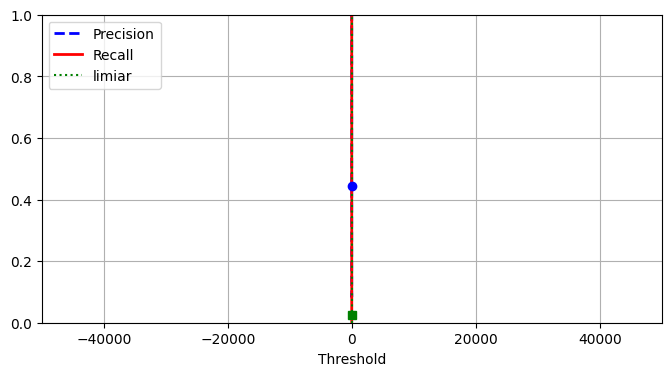

In [ ]:
confusionMatrix(sgd_clf, x_train, y_train_1)

Aplicando árvore de decisão:

In [ ]:
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [ ]:
tree_clf = DecisionTreeClassifier(random_state=1)
tree_clf = stdScalerModel(tree_clf)

# Grade de parâmetros para escolher
parameters = {
    'max_depth': np.arange(1, 10),
    'criterion': ['entropy', 'gini'],
    'splitter': ['best', 'random'],
    'min_impurity_decrease': [0.000001, 0.00001, 0.0001],
    'max_features': ['log2', 'sqrt']
}

# Tipo de pontuação usado para comparar combinações de parâmetros
paramScore = metrics.make_scorer(metrics.recall_score)

# Executar a pesquisa de grade
gridObj = GridSearchCV(
    tree_clf, 
    param_grid = parameters, 
    scoring = paramScore, 
    cv = 10
)

gridObj = gridObj.fit(x_train, y_train)

# Defina o classificador para a melhor combinação de parâmetros
tree_clf = gridObj.best_estimator_

# Ajuste o melhor algoritmo aos dados
tree_clf.fit(x_train, y_train)

# Exibir resultados
t_pred = tree_clf.predict(x_test)
print("Pontuação no Teste: ", metrics.accuracy_score(y_test, t_pred))

Pontuação no Teste:  0.8986666666666666


Aplicação de Random Forest:

In [ ]:
from sklearn.ensemble import RandomForestRegressor

Utilizando 500 árvores

In [ ]:
rf_clf = RandomForestRegressor(n_estimators = 500, random_state = 42)
rf_clf = stdScalerModel(rf_clf)
rf_clf.fit(x_train, y_train)

RandomForestRegressor(n_estimators=500, random_state=42)

In [ ]:
f_pred = rf_clf.predict(x_test)

In [ ]:
errors = abs(f_pred - y_test)

In [ ]:
print('MAE:', round(np.mean(errors), 2), 'degrees.')

MAE: 0.12 degrees.


In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
mape = mean_absolute_error(y_test, f_pred)*100
print('MAPE:', mape)

MAPE: 12.481200000000001


In [ ]:
accuracy = 100 - np.mean(mape)
print('Acurácia:', round(accuracy, 2), '%.')

Acurácia: 87.52 %.


Utilizando 1000 árvores

In [ ]:
rf_clf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
rf_clf = stdScalerModel(rf_clf)
rf_clf.fit(x_train, y_train)

RandomForestRegressor(n_estimators=1000, random_state=42)

In [ ]:
f_pred = rf_clf.predict(x_test)

In [ ]:
errors = abs(f_pred - y_test)
print('MAE:', round(np.mean(errors), 2), 'degrees.')

MAE: 0.12 degrees.


In [ ]:
mape = mean_absolute_error(y_test, f_pred)*100
print('MAPE:', mape)

MAPE: 12.485533333333333


In [ ]:
accuracy = 100 - np.mean(mape)
print('Acurácia:', round(accuracy, 2), '%.')

Acurácia: 87.51 %.


Aplicando KNN:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier as KNN

3 Vizinhos

In [ ]:
knn = KNN(n_neighbors=3)
knn = stdScalerModel(knn)
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
k_pred = knn.predict(x_test)

In [ ]:
print("Score - Test: {:.2f}".format(knn.score(x_test, y_test)))

Score - Test: 0.89


10 Vizinhos

In [ ]:
knn = KNN(n_neighbors=10)
knn = stdScalerModel(knn)
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [ ]:
k_pred = knn.predict(x_test)
print("Score - Test: {:.2f}".format(knn.score(x_test, y_test)))

Score - Test: 0.90


In [ ]:
res = metrics.confusion_matrix(y_test, k_pred)
print('Matriz de confusão:')
print(res)

Matriz de confusão:
[[1339   15]
 [ 133   13]]


Aplicando redes neurais:

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Input, Dropout, BatchNormalization, Flatten

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

earlystop = EarlyStopping(monitor='loss', patience = 10)
learning_rate_reduction = ReduceLROnPlateau(monitor = 'accuracy',patience = 2,verbose = 1,factor = 0.5,min_lr = 0.00001)
callbacks = [earlystop,learning_rate_reduction]

In [ ]:
model = Sequential()

model.add(Dense(128, activation = 'relu', input_dim = 2))

model.add(Dense(128, activation = 'relu'))

model.add(Dense(128, activation = 'relu'))

model.add(Flatten())
model.add(Dense(1, activation = 'sigmoid'))

In [ ]:
model.compile(
    loss="binary_crossentropy",
    optimizer="adam",
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               384       
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 flatten (Flatten)           (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 33,537
Trainable params: 33,537
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(
    x_train,
    y_train.values,
    epochs=30,
    batch_size=64,
    callbacks = callbacks
)

Epoch 1/30
55/55 [==============================] - 1s 3ms/step - loss: 0.3942 - accuracy: 0.8940 - lr: 0.0010
Epoch 2/30
55/55 [==============================] - 0s 3ms/step - loss: 0.3177 - accuracy: 0.9045 - lr: 0.0010
Epoch 3/30
55/55 [==============================] - 0s 3ms/step - loss: 0.3070 - accuracy: 0.9045 - lr: 0.0010
Epoch 4/30
39/55 [====================>.........] - ETA: 0s - loss: 0.3199 - accuracy: 0.8950
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
55/55 [==============================] - 0s 3ms/step - loss: 0.3001 - accuracy: 0.9043 - lr: 0.0010
Epoch 5/30
55/55 [==============================] - 0s 3ms/step - loss: 0.2956 - accuracy: 0.9060 - lr: 5.0000e-04
Epoch 6/30
55/55 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.9048 - lr: 5.0000e-04
Epoch 7/30
39/55 [====================>.........] - ETA: 0s - loss: 0.2919 - accuracy: 0.9062
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.000250000011874362

In [ ]:
earlystop = EarlyStopping(monitor='loss', patience = 10)
learning_rate_reduction = ReduceLROnPlateau(monitor = 'accuracy',patience = 4,verbose = 1,factor = 0.5,min_lr = 0.00001)
callbacks = [earlystop,learning_rate_reduction]

In [ ]:
model.fit(
    x_train,
    y_train.values,
    epochs=60,
    batch_size=32,
    callbacks = callbacks
)

Epoch 1/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2742 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 2/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2741 - accuracy: 0.9060 - lr: 1.0000e-05
Epoch 3/60
110/110 [==============================] - 0s 4ms/step - loss: 0.2739 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 4/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2737 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 5/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2735 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 6/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2733 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 7/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.9057 - lr: 1.0000e-05
Epoch 8/60
110/110 [==============================] - 0s 3ms/step - loss: 0.2730 - accuracy: 0.9060 - lr: 1.0000e-05
Epoch 9/60
110/110 [==============================] - 0s 3ms/ste